In [46]:
%matplotlib inline

import matplotlib.pyplot as plt

import pycaret
import pandas as pd
from pycaret.regression import *
from pycaret.utils import enable_colab
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

import pandas_profiling as pdp

import shap

In [47]:
enable_colab()

Colab mode enabled.


In [48]:
df = pd.read_csv('../SUMO_predict//data//data.csv')

In [49]:
df.drop_duplicates(inplace=True)
df.reset_index(drop=True, inplace=True)

In [50]:
df.drop(['Unnamed: 0'], axis=1, inplace=True)

In [51]:
train, test = train_test_split(df, random_state=53)

## データ入力，前処理の実行

#### setup()の実行
- 各変数の方を推定
- 推定が正しければ Enterキー，そうでなければ quit を入力
- 型の推定が誤っている変数については、setup()へ明示的に型を指定可能
- 引数 'silent = True' とすることでこのステップをスキップできる
- 'feature_selection = True' とすることで，特徴量が自動で選択される．ランダムフォレスト，AdaBoost，目的変数との線形相関といった複数のPermutation Importance の組み合わせに基づいて選択される．その際，'feature_selection_method' を'classic' か 'boruta'を指定できる．'feature_selection_threshold' を指定すること特徴量選択に使用される閾値を調整できる．値が大きいほど，選択される特徴量は多くなる．低い値に設定すると効率的ではあるが，アンダーフィットになる可能性がある．

In [52]:
reg1 = setup(data = train,
             train_size = 0.7, #学習データと検証データを7:3に分割
             target = 'fee',
             #numeric_imputation = 'mean', # 欠損値を平均値で補完する
             #categorical_features = ['madori'], # カテゴリ変数を指定
             ignore_features = ['title','address','madori','room','layout'],
             #feature_selection = True,
             #feature_selection_threshold=0.6, # 値が大きいほど，選択される特徴量の数が多くなる．
             #feature_selection_method='classic', # Permutation Importanvceによる選択．’boruta’とするとランダムフォレストと検定を用いた特徴量選択アルゴリズムを用いる．
             normalize = True, # 標準化の有無
             normalize_method = 'zscore', # 標準化の方法（'zscore'，'minmax'，'maxabs'，'robust'）
             #pca=True, # 主成分分析による次元削除
             #pca_method='linear', # 次元削除の方法（'linear'，'kernel'）
             #profile=True, # pandas-progiling によるEDA
             #log_data=True, # 学習データと検証データのCSVへの出力
             silent = True # 型推定の確認をスキップ
             ) 

,Description,Value
0,session_id,5842
1,Target,fee
2,Original Data,"(5517, 13)"
3,Missing Values,False
4,Numeric Features,7
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(3861, 7)"


In [53]:
# 複数のモデルの実行，比較
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.3495,2.6545,1.2894,0.9642,0.0518,0.0244,0.3490
rf,Random Forest Regressor,0.3851,3.0000,1.3990,0.9595,0.0582,0.0267,0.3920
gbr,Gradient Boosting Regressor,0.9480,3.9439,1.7899,0.9440,0.0918,0.0719,0.1560
dt,Decision Tree Regressor,0.4414,4.4601,1.8013,0.9389,0.0747,0.0300,0.0150
lightgbm,Light Gradient Boosting Machine,0.6546,5.4614,2.1228,0.9233,0.0712,0.0428,0.0790
knn,K Neighbors Regressor,1.1066,5.4760,2.2061,0.9199,0.1007,0.0772,0.0310
lar,Least Angle Regression,1.6214,6.4059,2.4446,0.9033,0.1460,0.1226,0.0100
br,Bayesian Ridge,1.6215,6.4059,2.4446,0.9033,0.1459,0.1226,0.0250
ridge,Ridge Regression,1.6215,6.4058,2.4446,0.9033,0.1459,0.1226,0.0120
lr,Linear Regression,1.6214,6.4059,2.4446,0.9033,0.1460,0.1226,1.4970


ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=5842, verbose=0, warm_start=False)

In [54]:
X = get_config('X') #全ての説明変数
X

,age,floor,management_fee,deposit,gratuity,access_mean,area
7286,0.770176,-0.182054,-1.661822,-0.124509,0.167274,-1.027092,-0.449200
6363,-0.959312,-0.391254,-0.272132,-0.119522,-0.723894,-1.923872,-0.565059
3139,0.358393,0.654745,0.323449,-0.114535,0.186035,0.049043,-0.669583
6254,0.276036,0.654745,0.323449,0.055026,0.504979,-2.461939,-0.086512
3055,-0.547529,-0.600454,-0.669186,-0.189341,-0.723894,-0.847736,-0.698548
...,...,...,...,...,...,...,...
3261,-0.382816,-0.182054,0.720503,0.468954,-0.723894,0.766466,0.881914
5883,0.605463,-0.182054,-0.669186,-0.134483,0.148512,-0.309669,-0.422124
6565,0.276036,1.909945,0.323449,0.099910,0.589406,-0.489025,0.196208
2933,-0.876956,-0.809654,1.316085,-0.598282,-0.723894,0.587111,-0.397567


In [55]:
y = get_config('y') # 全ての目的変数
y

7286     9.5
6363     9.6
3139     9.7
6254    13.1
3055     8.2
        ... 
3261    21.4
5883     9.3
6565    14.0
2933    11.9
797     23.0
Name: fee, Length: 5517, dtype: float32

In [56]:
X_train = get_config('X_train') # 分割後の学習用説明変数
X_train.head()

,age,floor,management_fee,deposit,gratuity,access_mean,area
3383,-0.712242,-0.600454,-0.272132,0.139807,0.664452,0.407755,0.291917
3677,-0.959312,-0.600454,0.422713,0.015130,1.583762,0.049043,-0.113588
5005,0.276036,1.909945,1.316085,2.014951,-0.723894,-1.206448,2.129913
2347,-0.959312,-0.809654,-0.669186,-0.598282,-0.723894,0.587111,-0.408272
89,-0.712242,-0.391254,0.323449,0.179703,-0.723894,-1.206448,-0.042436


In [57]:
y_train = get_config('y_train') # 分割後の学習用目的変数
y_train.head()

3383    14.800000
3677    12.300000
5005    26.200001
2347    11.500000
89      15.600000
Name: fee, dtype: float32

In [58]:
#X_val = get_config('X_test') # 分割後の検証用説明変数
#X_val.head()

In [59]:
#y_val = get_config('y_test') # 分割後の検証用目的変数
#y_val.head()

### 評価指標

- RMSE

|項目|概要|
|:----------|:---------------|
| 判断基準 | 0に近い程良い |
| 特徴         | 大きく予測を外した場合を重要視している            <br>予測を大きく外すと大幅に大きくなる傾向にある<br>回帰モデルの最も一般的な性能評価指標として用いられる |

- R2（決定係数）

|項目|概要|
|:----------|:---------------|
| 判断基準 | 0.6以下：全然予測できてない<br>0.8以上：良いモデル<br>0.9以上：過学習の可能性あり |
| 特徴         | 大きく予測を外した場合を重要視している<br>予測を大きく外すと大幅に大きくなる傾向にある              |


### 複数の推定器を個別に実行する

#### 結果，精度の可視化

- create_model() で引数として，モデルを渡すとモデルを生成できる．初期設定では，クロスバリデーション（K-Fold =10） で実行される．

- ハイパーパラメータの最適化は，tune_model() を使う．第一引数にはモデル，第二引数にはランダムグリッドサーチの回数，第三引数には最適化の対象を渡す.

- evaluate_model() によって，モデルの解析結果を表示できる．タブを切り替えることでモデルの複数の概要がわかる．
  - Error Plot
    
    横軸に実際の値，縦軸に予測値をプロットする．予測が完全であれば、傾き1の直線上に点が乗る．点が傾き1の直線周辺に集まるモデルが良いモデルになる．予測値が大きい領域では誤差が大きくなっているように見える．
  - Learning Curve（学習曲線）
  
    データ数に応じた予測精度を表示するグラフで，横軸にデータサイズ，縦軸に予測精度をプロットする．良いモデルの指標としてはデータが増えるごとにtraining scoreが減少し，cross validation scoreが増加することが望ましい．cross validation scoreとtraining scoreの差が大きかった場合は，学習数が足りてない恐れがあるため，データ数を増やすことでモデルの精度の向上が図れる．

    訓練データが少ない場合は，モデルはオーバーパラメトライズの状態になり，train-trainの精度が高く，train-testの精度が低くなります。これは過学習状態であるとも言える．過学習を起こすのは、サンプル数が少ないにも関わらず、モデルが複雑（特徴量が多い・パラメーター数が多い）すぎる場合が多い．そのため，過学習への対策として，サンプル数を増やすか、モデルのパラメーター数を減らすか（特徴量を減らすか）がある．
  - Feature Importance（寄与度）

    目的変数に及ぼす影響が大きい順に上から特徴量が上位10まで表示される．

#### Extra Trees モデル

In [60]:
# Extra Trees Regressor を実行
et = create_model('et')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.3173,0.5347,0.7312,0.9922,0.0460,0.0253
1,0.3838,2.3663,1.5383,0.9678,0.0594,0.0268
2,0.3316,0.6488,0.8055,0.9871,0.0460,0.0256
3,0.6135,16.8533,4.1053,0.7891,0.0927,0.0302
4,0.3163,0.4201,0.6481,0.9933,0.0461,0.0261
5,0.2889,2.3536,1.5342,0.9698,0.0453,0.0188
6,0.2633,0.4044,0.6360,0.9929,0.0370,0.0201
7,0.3169,0.6551,0.8094,0.9916,0.0529,0.0256
8,0.2775,0.6162,0.7850,0.9863,0.0476,0.0218
9,0.3854,1.6923,1.3009,0.9721,0.0451,0.0234


In [61]:
# Extra Trees Regressor のハイパーパラメータの最適化
tuned_et = tune_model(et, n_iter = 100, optimize = 'rmse')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.7153,1.0447,1.0221,0.9848,0.0816,0.0647
1,0.7719,3.2857,1.8127,0.9553,0.0784,0.0583
2,0.7348,1.2752,1.1293,0.9746,0.0783,0.0622
3,1.0123,17.8587,4.2260,0.7765,0.1109,0.0663
4,0.7053,0.9748,0.9873,0.9845,0.0743,0.0605
5,0.7104,3.3434,1.8285,0.9571,0.0762,0.0545
6,0.7060,1.1014,1.0495,0.9808,0.0741,0.0598
7,0.6890,1.1250,1.0606,0.9856,0.0773,0.0595
8,0.6996,1.1846,1.0884,0.9737,0.0787,0.0581
9,0.7716,2.3888,1.5456,0.9607,0.0755,0.0573


In [62]:
# 結果の確認
evaluate_model(tuned_et)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [63]:
plot_model(tuned_et, plot='residuals_interactive')

    'data': [{'hovertemplate': 'Split=train<br>Predictions…

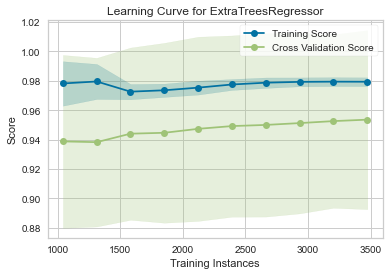

In [64]:
# 学習曲線
plot_model(tuned_et,plot='learning')

In [65]:
plot_model(tuned_et, plot='parameter')

,Parameters
bootstrap,False
ccp_alpha,0.0
criterion,mse
max_depth,11
max_features,1.0
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0.005
min_impurity_split,None
min_samples_leaf,2


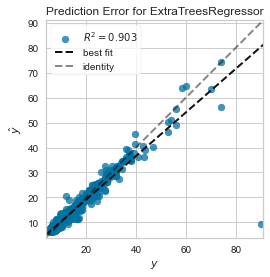

In [66]:
# Validation Curve
plot_model(tuned_et, plot='error') #save=True にすると png で保存可能

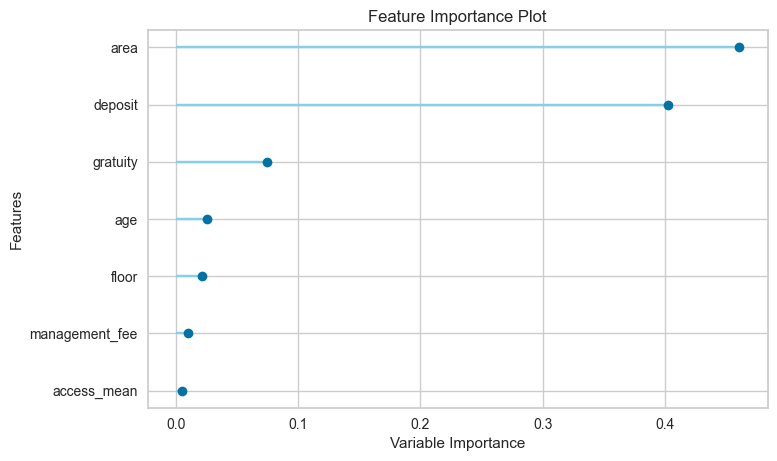

In [67]:
# Feature Importance
plot_model(tuned_et, plot='feature')

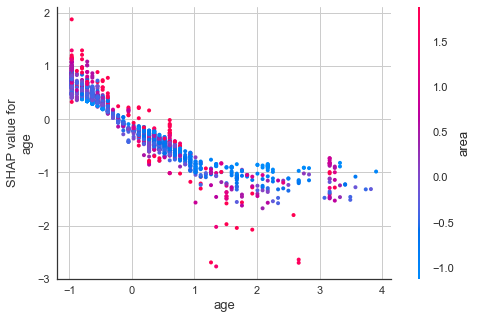

In [107]:
# SHAPによるモデルの解釈(dependence_plot)
interpret_model(tuned_et, plot = 'correlation')

In [69]:
# 予測結果
predictions_et = predict_model(tuned_et, data=test)
predictions_et.head()

,title,address,age,floor,fee,management_fee,deposit,gratuity,madori,access_mean,room,layout,area,Label
1327,リーブルグラント西新宿イースト,東京都新宿区西新宿８,3,8,11.9,1.0,11.9,17.85,1K,7.333333,1,K,25.37,11.747796
319,フレンシア四谷左門町,東京都新宿区左門町,3,11,19.4,0.6,38.8,19.40,1LDK,8.000000,1,LDK,40.03,19.160004
1355,ラ・トゥール新宿グランド,東京都新宿区西新宿８,11,38,65.0,0.0,195.0,0.00,2LDK,7.333333,2,LDK,90.43,63.831884
5856,プレミアムキューブG四谷左門町,東京都新宿区左門町,9,8,10.5,1.2,10.5,10.50,1K,9.000000,1,K,25.58,10.617694
259,グランハイツ高田馬場,東京都新宿区高田馬場３,13,14,22.8,1.5,22.8,45.60,2LDK,6.333333,2,LDK,59.65,25.217945


#### Ramdom Forest の実行

In [70]:
# Random Forest Regressor を実行
rf = create_model('rf')

# Random Forest のハイパーパラメータの最適化
tuned_rf = tune_model(rf, n_iter = 100, optimize = 'rmse')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.4514,0.9785,0.9892,0.9857,0.0628,0.0362
1,0.4756,2.7187,1.6488,0.9630,0.0684,0.0334
2,0.3694,0.7165,0.8465,0.9857,0.0520,0.0282
3,0.7169,19.7892,4.4485,0.7524,0.1118,0.0360
4,0.3702,0.6439,0.8024,0.9898,0.0562,0.0298
5,0.4421,3.6495,1.9104,0.9531,0.0590,0.0264
6,0.3882,0.8066,0.8981,0.9859,0.0509,0.0283
7,0.4670,1.8983,1.3778,0.9758,0.0722,0.0351
8,0.4488,1.2765,1.1298,0.9716,0.0652,0.0325
9,0.5187,2.5314,1.5910,0.9583,0.0617,0.0319


In [71]:
# 結果の確認
evaluate_model(tuned_rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

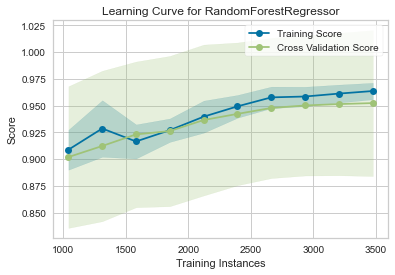

In [72]:
# 学習の精度
plot_model(estimator = tuned_rf, plot = 'learning')

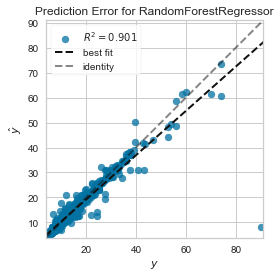

In [73]:
# Prediction Error Plot
plot_model(estimator = tuned_rf, plot = 'error')

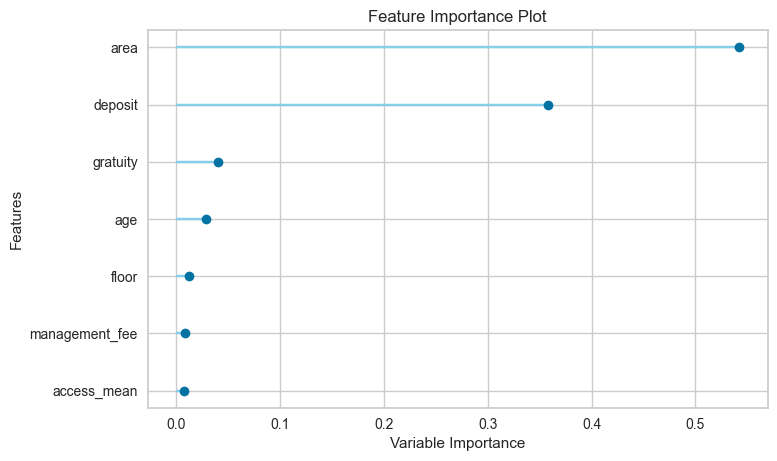

In [74]:
# Feature Importance
plot_model(estimator=tuned_rf, plot='feature')

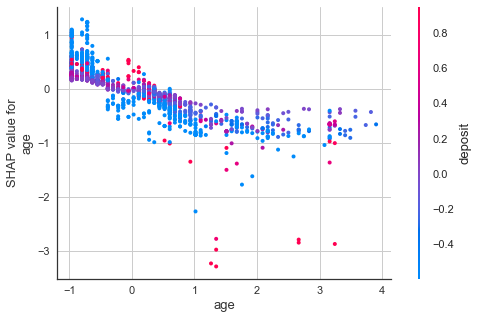

In [75]:
# SHAPによるモデルの解釈(dependence_plot)
interpret_model(tuned_rf, plot = 'correlation')

In [76]:
# 予測結果
predictions_rf = predict_model(tuned_rf, data=test)
predictions_rf.head()

,title,address,age,floor,fee,management_fee,deposit,gratuity,madori,access_mean,room,layout,area,Label
1327,リーブルグラント西新宿イースト,東京都新宿区西新宿８,3,8,11.9,1.0,11.9,17.85,1K,7.333333,1,K,25.37,11.900000
319,フレンシア四谷左門町,東京都新宿区左門町,3,11,19.4,0.6,38.8,19.40,1LDK,8.000000,1,LDK,40.03,19.995000
1355,ラ・トゥール新宿グランド,東京都新宿区西新宿８,11,38,65.0,0.0,195.0,0.00,2LDK,7.333333,2,LDK,90.43,62.987857
5856,プレミアムキューブG四谷左門町,東京都新宿区左門町,9,8,10.5,1.2,10.5,10.50,1K,9.000000,1,K,25.58,10.500000
259,グランハイツ高田馬場,東京都新宿区高田馬場３,13,14,22.8,1.5,22.8,45.60,2LDK,6.333333,2,LDK,59.65,22.855000


#### LightGBM の実行

In [77]:
# LightGBM を実行
lgbm = create_model('lightgbm')

# LightGBM のハイパーパラメータの最適化
tuned_lgbm = tune_model(lgbm, n_iter = 100, optimize = 'rmse')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.5091,1.0647,1.0318,0.9845,0.0597,0.0408
1,0.5748,2.6261,1.6205,0.9643,0.0721,0.0423
2,0.4847,0.9097,0.9538,0.9819,0.0592,0.0389
3,0.7594,19.0025,4.3592,0.7622,0.1108,0.0438
4,0.4689,0.8330,0.9127,0.9868,0.0573,0.0376
5,0.4869,2.8688,1.6938,0.9632,0.0588,0.0352
6,0.5260,1.1413,1.0683,0.9801,0.0562,0.0388
7,0.4746,0.9800,0.9900,0.9875,0.0611,0.0381
8,0.5011,1.0351,1.0174,0.9770,0.0672,0.0403
9,0.7069,3.5311,1.8791,0.9419,0.0741,0.0451


In [78]:
# 結果の確認
evaluate_model(tuned_lgbm)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

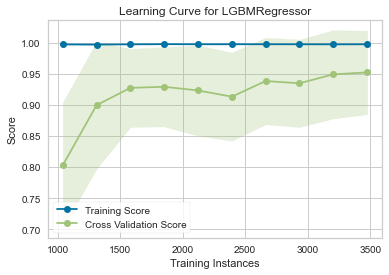

In [79]:
# 学習の精度
plot_model(estimator = tuned_lgbm, plot = 'learning')

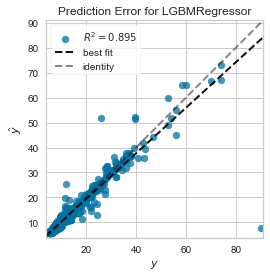

In [80]:
# Prediction Error Plot
plot_model(estimator = tuned_lgbm, plot = 'error')

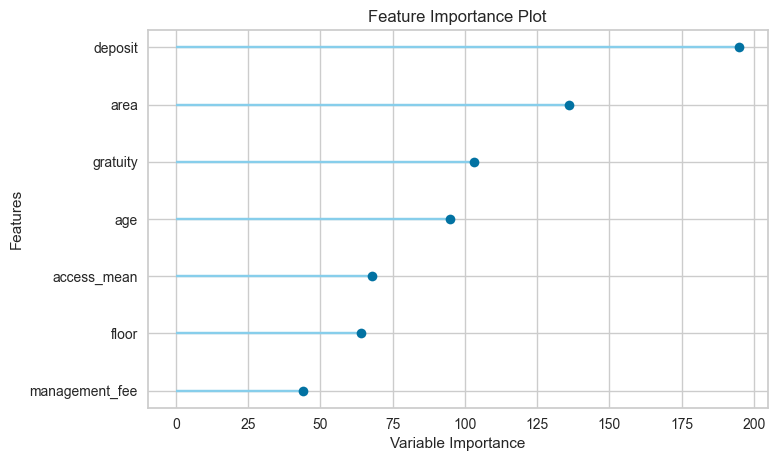

In [81]:
# Feature Importance
plot_model(estimator=tuned_lgbm, plot='feature')

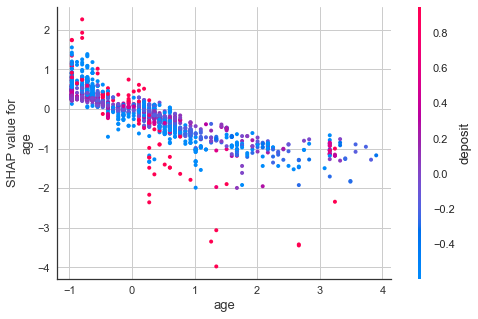

In [82]:
# SHAPによるモデルの解釈(dependence_plot)
interpret_model(tuned_lgbm, plot = 'correlation')

In [83]:
# 予測結果
predictions_lgbm = predict_model(tuned_lgbm, data=test)
predictions_lgbm.head()

,title,address,age,floor,fee,management_fee,deposit,gratuity,madori,access_mean,room,layout,area,Label
1327,リーブルグラント西新宿イースト,東京都新宿区西新宿８,3,8,11.9,1.0,11.9,17.85,1K,7.333333,1,K,25.37,11.941170
319,フレンシア四谷左門町,東京都新宿区左門町,3,11,19.4,0.6,38.8,19.40,1LDK,8.000000,1,LDK,40.03,20.620039
1355,ラ・トゥール新宿グランド,東京都新宿区西新宿８,11,38,65.0,0.0,195.0,0.00,2LDK,7.333333,2,LDK,90.43,64.007328
5856,プレミアムキューブG四谷左門町,東京都新宿区左門町,9,8,10.5,1.2,10.5,10.50,1K,9.000000,1,K,25.58,10.801971
259,グランハイツ高田馬場,東京都新宿区高田馬場３,13,14,22.8,1.5,22.8,45.60,2LDK,6.333333,2,LDK,59.65,26.027298


#### モデルのアンサンブル

アンサンブル，ブレンド，スタッキングが可能

In [84]:
ensemble = blend_models([tuned_et, tuned_rf, tuned_lgbm])

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.5013,0.7207,0.8489,0.9895,0.0615,0.0434
1,0.5574,2.6707,1.6342,0.9637,0.0681,0.0405
2,0.4761,0.7507,0.8664,0.9851,0.0565,0.0391
3,0.7496,18.0857,4.2527,0.7737,0.1058,0.0444
4,0.4519,0.5785,0.7606,0.9908,0.0555,0.0378
5,0.4885,3.0223,1.7385,0.9612,0.0589,0.0346
6,0.4875,0.7861,0.8866,0.9863,0.0535,0.0379
7,0.4769,0.9483,0.9738,0.9879,0.0637,0.0399
8,0.4949,0.9257,0.9621,0.9794,0.0642,0.0393
9,0.6062,2.3510,1.5333,0.9613,0.0629,0.0406


In [85]:
# スタッキング
gbr = create_model('gbr')

stacker = stack_models([tuned_et, tuned_rf, tuned_lgbm], meta_model=gbr)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.5527,1.6323,1.2776,0.9762,0.0600,0.0413
1,0.6191,3.5491,1.8839,0.9517,0.0735,0.0420
2,0.4582,0.7041,0.8391,0.9860,0.0507,0.0341
3,0.8065,18.9311,4.3510,0.7631,0.1053,0.0415
4,0.4636,0.7659,0.8751,0.9878,0.0531,0.0348
5,0.4514,2.5916,1.6099,0.9667,0.0535,0.0305
6,0.4697,0.9212,0.9598,0.9839,0.0493,0.0334
7,0.4830,1.0442,1.0219,0.9867,0.0616,0.0369
8,0.5075,1.3558,1.1644,0.9699,0.0623,0.0369
9,0.5424,1.3900,1.1790,0.9771,0.0534,0.0354


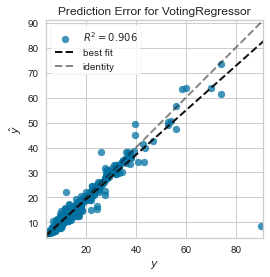

In [86]:
plot_model(ensemble, plot='error')

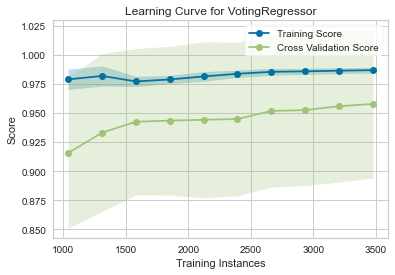

In [106]:
plot_model(ensemble, plot='learning')

In [88]:
evaluate_model(ensemble)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [89]:
pred_ensemble = predict_model(ensemble, data=test)
pred_ensemble

,title,address,age,floor,fee,management_fee,deposit,gratuity,madori,access_mean,room,layout,area,Label
1327,リーブルグラント西新宿イースト,東京都新宿区西新宿８,3,8,11.9,1.0,11.9,17.85,1K,7.333333,1,K,25.37,11.862988
319,フレンシア四谷左門町,東京都新宿区左門町,3,11,19.4,0.6,38.8,19.40,1LDK,8.000000,1,LDK,40.03,19.925014
1355,ラ・トゥール新宿グランド,東京都新宿区西新宿８,11,38,65.0,0.0,195.0,0.00,2LDK,7.333333,2,LDK,90.43,63.609023
5856,プレミアムキューブG四谷左門町,東京都新宿区左門町,9,8,10.5,1.2,10.5,10.50,1K,9.000000,1,K,25.58,10.639888
259,グランハイツ高田馬場,東京都新宿区高田馬場３,13,14,22.8,1.5,22.8,45.60,2LDK,6.333333,2,LDK,59.65,24.700081
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6165,ラ・コピエ四谷３丁目,東京都新宿区四谷３,20,11,26.0,0.0,52.0,26.00,2LDK,2.000000,2,LDK,63.34,24.781829
4174,ＪＲ中央線 東中野駅 3階建 築20年,東京都新宿区北新宿４,20,1,7.0,0.2,0.0,3.50,1K,10.333333,1,K,20.35,7.371879
7271,都営大江戸線 若松河田駅 5階建 新築,東京都新宿区余丁町,0,5,7.9,1.0,7.9,0.00,ワンルーム,8.666667,1,R,14.06,7.499197
2464,ガーネットコート四谷,東京都新宿区左門町,18,7,29.3,1.0,29.3,0.00,2LDK,8.666667,2,LDK,76.49,28.017700


## SHAPによるモデルの解釈

### SHAP（SHapley Additive exPlanations）とは
SHAPとは，shapley値を用いて，予測結果に対して特徴量がどのように寄与するかを可視化する方法．

shapley値とは限界貢献度の期待値（平均値）nokoto.
機械学習に当てはめる場合．予測した値に対して，それぞれの特徴量が予測にどのような影響を与えたかを算出した値と言える．

### method
TreeExplainer()は勾配ブースティング（XGBoost, LightGBM, CatBoostなど）で作成したモデルを読み込み、shapley値を導くためのインスタンス.

#### 引数
- model_output: モデルの出力方法．margin(生データのshape値)，probability(確率空間に変換されたshapley値)，log_loss()がある．


### メリット
- 計算方法が公開されており，貢献度が数値化されるため，完全な透明性が求められる場合に有効
- データ数が少ない場合でも結果が安定
- 計算時間が少ない

### デメリット
- 計算できるアルゴリズムが限定的
- アンサンブルしたモデルには使用できない

In [90]:
# jupyter notebookにコードを表示させるためにjsをロード
shap.initjs()

explainer_et = shap.TreeExplainer(model=tuned_et, model_output='margin')
explainer_rf = shap.TreeExplainer(model=tuned_rf, model_output='margin')
explainer_lgbm = shap.TreeExplainer(model=tuned_lgbm, model_output='margin')

In [91]:
# shapley値の計算
shap_values_et = explainer_et.shap_values(X=X)
shap_values_rf = explainer_rf.shap_values(X=X)
shap_values_lgbm = explainer_lgbm.shap_values(X=X)

### Extra Tree について

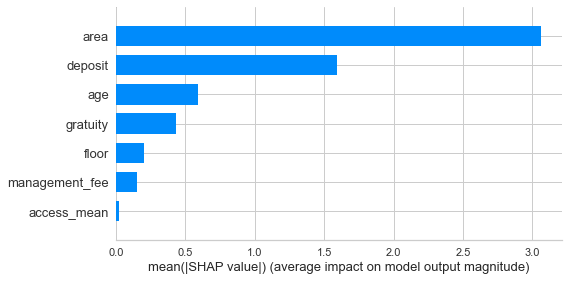

In [92]:
# etの特徴量の重要度
shap.initjs()
shap.summary_plot(shap_values_et, X, plot_type="bar")

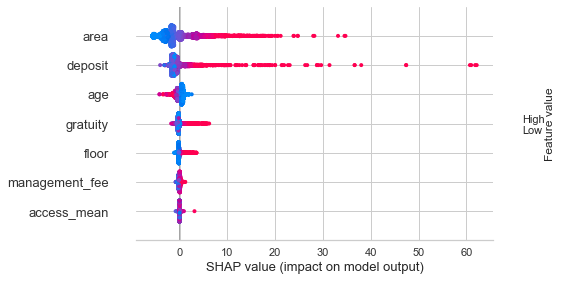

In [93]:
# etの相関関係
shap.initjs()
shap.summary_plot(shap_values_et, X)

In [94]:
# etのforce_plot(shapley値と特徴変数の寄与度)
shap.initjs()
shap.force_plot(base_value=explainer_et.expected_value, shap_values=shap_values_et, features=X)

In [95]:
# etのforce_plot(shapley値と特徴変数の寄与度)
shap.initjs()
shap.force_plot(base_value=explainer_et.expected_value, shap_values=shap_values_et[16,:], features=X.iloc[16,:])

### Random Forest について

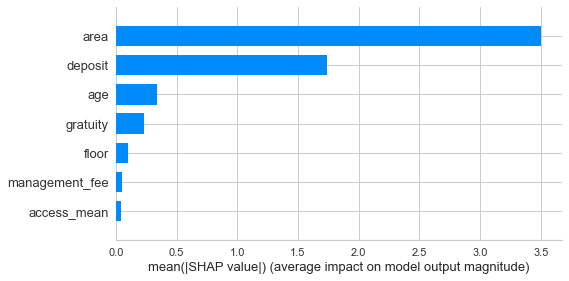

In [96]:
# rfの特徴量の重要度
shap.initjs()
shap.summary_plot(shap_values_rf, X, plot_type="bar")

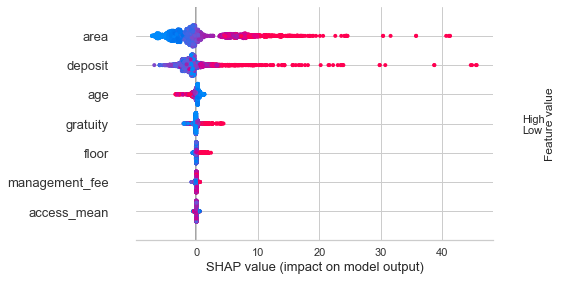

In [97]:
# rfの相関関係
shap.initjs()
shap.summary_plot(shap_values_rf, X)

In [98]:
# rfのforce_plot(shapley値と特徴変数の寄与度)
shap.initjs()
shap.force_plot(base_value=explainer_rf.expected_value, shap_values=shap_values_rf, features=X)

In [99]:
# rfのforce_plot(shapley値と特徴変数の寄与度)
shap.initjs()
shap.force_plot(base_value=explainer_rf.expected_value, shap_values=shap_values_rf[15,:], features=X.iloc[15,:])

### LightGBM について

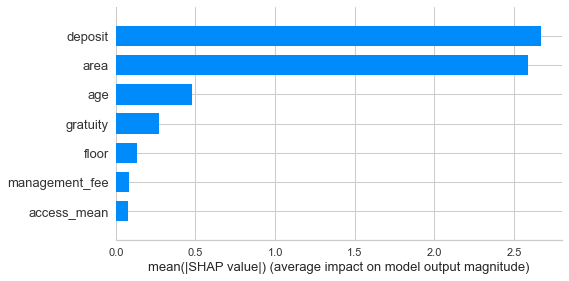

In [100]:
# lgbmの特徴量の重要度
shap.initjs()
shap.summary_plot(shap_values_lgbm, X, plot_type="bar")

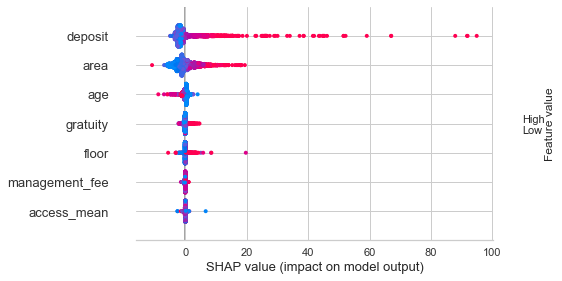

In [101]:
# lgbmの相関関係
shap.initjs()
shap.summary_plot(shap_values_lgbm, X)

In [102]:
# lgbmのforce_plot(shapley値と特徴変数の寄与度)
shap.initjs()
shap.force_plot(base_value=explainer_lgbm.expected_value, shap_values=shap_values_lgbm, features=X)

In [103]:
# lgbmのforce_plot(shapley値と特徴変数の寄与度)
shap.initjs()
shap.force_plot(base_value=explainer_lgbm.expected_value, shap_values=shap_values_lgbm[0,:], features=X.iloc[0,:])

#### モデルの確定

In [104]:
final = finalize_model(ensemble)
print(final)

VotingRegressor(estimators=[('et',
                             ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0,
                                                 criterion='mse', max_depth=11,
                                                 max_features=1.0,
                                                 max_leaf_nodes=None,
                                                 max_samples=None,
                                                 min_impurity_decrease=0.005,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=2,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=120, n_jobs=-1,
                                                 oob_score=False,
                                                 random_state=5842, ve...
            

In [118]:
test = setup(
    data = test,
    target = 'fee',
    #numeric_imputation = 'mean', # 欠損値を平均値で補完する
    #categorical_features = ['madori'], # カテゴリ変数を指定
    ignore_features = ['title','address','madori','room','layout'],
    #feature_selection = True,
    #feature_selection_threshold=0.6, # 値が大きいほど，選択される特徴量の数が多くなる．
    #feature_selection_method='classic', # Permutation Importanvceによる選択．’boruta’とするとランダムフォレストと検定を用いた特徴量選択アルゴリズムを用いる．
    normalize = True, # 標準化の有無
    normalize_method = 'zscore', # 標準化の方法（'zscore'，'minmax'，'maxabs'，'robust'）
    #pca=True, # 主成分分析による次元削除
    #pca_method='linear', # 次元削除の方法（'linear'，'kernel'）
    #profile=True, # pandas-progiling によるEDA
    #log_data=True, # 学習データと検証データのCSVへの出力
    silent = True # 型推定の確認をスキップ
    )

,Description,Value
0,session_id,2716
1,Target,fee
2,Original Data,"(1840, 13)"
3,Missing Values,False
4,Numeric Features,7
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(1287, 7)"


In [119]:
test_X = get_config('X')
test_X.head()

,age,floor,management_fee,deposit,gratuity,access_mean,area
1327,-0.687177,0.624669,0.332196,-0.023842,0.979962,-0.640928,-0.364525
319,-0.687177,1.257534,-0.541253,1.094862,1.124594,-0.275150,0.482531
1355,0.018435,6.953318,-1.851426,7.590831,-0.685637,-0.640928,3.394648
5856,-0.157968,0.624669,0.768920,-0.082064,0.294127,0.273516,-0.352392
259,0.194838,1.890399,1.424007,0.429462,3.569339,-1.189594,1.616176


In [120]:
test_y = get_config('y')
test_y.head()

1327    11.900000
319     19.400000
1355    65.000000
5856    10.500000
259     22.799999
Name: fee, dtype: float32

In [121]:
final.score(test_X, test_y)

0.9638907823088756

In [122]:
pred = final.predict(test_X)
rmse = mean_squared_error(test_y, pred, squared=False)
r2 = r2_score(test_y, pred)

In [123]:
pred

array([11.59002481, 18.42885883, 58.35429295, ...,  7.9399341 ,
       26.10370841, 10.56337272])

In [124]:
print(f'RMSE: {rmse}')
print(f'R2: {r2}')

RMSE: 1.6596834902274467
R2: 0.9638907823088756


クロスバリデーション精度
- RMSE：1.5162
- R2：0.9549
過学習は起きていないと言える．	

In [125]:
# モデルの保存

save_model(final, '../SUMO_predict//model//FinalModel')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=False,
                                       features_todrop=['title', 'address',
                                                        'madori', 'room',
                                                        'layout'],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[], target='fee',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fil...
                                                             feature_fraction=1.0,
                                                             importance_type='split',
                       